<a href="https://colab.research.google.com/github/ISL-0111/XAI_AIPI590.01_2025Fall/blob/main/Week5_Explainable_Techniques_II.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Explainable Techniques II

**Name: Ilseop(Shawn) Lee**

### Instructions
For a model and dataset of your choice, produce PDP, ICE, and ALE plots. *Exploratory analysis* of your dataset should be performed to determine the amount of *correlation* between features.  

(1)Provide a comprehensive explanation of your plots.<br> (2)Discuss any interesting findings that are shown in the plots.<br> (3)Discuss any differences you see in the PDP and ALE plots.<br> (4)Discuss your exploratory findings around correlation between features and the impact this has (if any) on your results.

**Research Questions:**
- Which aircraft specifications (seats, class, type) most strongly influence fuel efficiency?
- How do route characteristics (distance, domestic vs international, departure continent) affect CO2 emissions per km?
- What combinations of features represent the most fuel-efficient aviation operations?
- How do feature interactions and correlations impact the interpretability of machine learning models in this domain?

----

#### **Case Summary**

**Objective: Understanding Contributing Factors to Aviation Fuel Efficiency** <br>
- Which aircraft specifications (seats, class, type, and others) most strongly influence fuel efficiency?

**Dataset: 2019 Global Aviation Traffic and CO2 Emissions**
- Zenodo Repository (https://zenodo.org/records/10143773) containing global aviation data covering about 286K flight routes in 2019

**Features**
- Target Variable: co2_per_distance (CO₂ emission per km)
- Predictor Variables <br>
    - 'departure_continent': Origin of flights <br>
    - 'distance_km': Flight distance <br>
    - 'seats': Number of available seats per flight(Cumulative total) <br>
    - 'domestic': domestic(1), international(0) <br>
    - 'acft_class': 8 aircraft types (WB: Wide Body, NB: Narrow Body, RJ: Regional Jet, PJ: Private Jet, TP: Turbo Propeller, PP: Piston Propeller, HE: Helicopter, OTHER)  <br>

    *Note: This dataset has been preprocessed in my previous personal project, with basic data cleaning was already completed.*

**Model: Random Forest**

**Assignment Approach:**
Rather than finding the best performing model through experiments, I focused on XAI tasks:<br>
- 1. **Exploratory Data Analysis:** Including feature correlation assessment and distribution analysis<br>
- 2. **Model Development:** Random Forest with tapered weights on the number of flights to balance high-traffic route impact with diverse and rare route coverage<br>
- 3. **XAI Implementation:** PDP, ALE, and ICE plots to understand feature effects and interactions<br>
- 4. **Comparative Analysis:** Examining differences between explanation methods to understand correlation impacts
-----

#### Dataset Preparation

In [ ]:
import os
import datetime
import warnings
import numpy as np
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, GroupShuffleSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.utils import resample
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from matplotlib.ticker import FuncFormatter
from scipy.stats import chi2_contingency
import joblib


df = pd.read_parquet("/Users/ilseoplee/enivornmental_impact_of_aviation-2/0.Data_after_cleaning/cleaned_aviation_data_v3.parquet")
display(df.head(5))
display(df.dtypes)

df = df.copy()
df['co2_per_distance'] = df["co2"] / df["distance_km"]
df = df.drop_duplicates()

selected_features = ['departure_continent', 'distance_km','seats', 'domestic', 'co2_per_distance', 'acft_class']
df_sorted = df[selected_features].copy()

numeric_cols = ['seats', 'co2_per_distance', 'distance_km']
categorical_cols = ['departure_continent', 'domestic', 'acft_class']

print(f"Dataset shape: {df_sorted.shape}")
print(f"Features: {selected_features}")
print(f"Numeric columns: {numeric_cols}")
print(f"Categorical columns: {categorical_cols}")

,airline_iata,acft_icao,acft_class,seymour_proxy,source,seats,n_flights,iata_departure,iata_arrival,departure_lon,...,distance_km,ask,rpk,fuel_burn_seymour,fuel_burn,co2,domestic,log_co2,log_distance,co2_per_distance
0,1SQ,PA32,PP,P28B,BTS,62112.0,11466.5,SPN,TIQ,145.729004,...,17.765225,1.103434e+06,9.092294e+05,20.486379,2.349071e+05,7.423063e+05,1,13.517519,2.932005,41784.233355
1,1SQ,PA32,PP,P28B,BTS,62112.0,11466.5,TIQ,SPN,145.619003,...,17.765225,1.103434e+06,9.092294e+05,20.486379,2.349071e+05,7.423063e+05,1,13.517519,2.932005,41784.233355
2,HA,B712,NB,B712,BTS,1246720.0,9740.0,HNL,OGG,-157.924228,...,162.001417,2.019704e+08,1.664236e+08,1305.895783,1.271942e+07,4.019338e+07,1,17.509213,5.093759,248105.130283
3,HA,B712,NB,B712,BTS,1246720.0,9740.0,OGG,HNL,-156.431212,...,162.001417,2.019704e+08,1.664236e+08,1305.895783,1.271942e+07,4.019338e+07,1,17.509213,5.093759,248105.130283
4,HA,B712,NB,B712,BTS,879296.0,6869.5,HNL,KOA,-157.924228,...,262.778946,2.310605e+08,1.903938e+08,1567.819046,1.077013e+07,3.403362e+07,1,17.342859,5.575111,129514.257569


airline_iata             object
acft_icao                object
acft_class               object
seymour_proxy            object
source                   object
seats                   float64
n_flights               float64
iata_departure           object
iata_arrival             object
departure_lon           float64
departure_lat           float64
departure_country        object
departure_continent      object
arrival_lon             float64
arrival_lat             float64
arrival_country          object
arrival_continent        object
seats_no_est_scaling    float64
distance_km             float64
ask                     float64
rpk                     float64
fuel_burn_seymour       float64
fuel_burn               float64
co2                     float64
domestic                  int64
log_co2                 float64
log_distance            float64
co2_per_distance        float64
dtype: object

Dataset shape: (286076, 6)
Features: ['departure_continent', 'distance_km', 'seats', 'domestic', 'co2_per_distance', 'acft_class']
Numeric columns: ['seats', 'co2_per_distance', 'distance_km']
Categorical columns: ['departure_continent', 'domestic', 'acft_class']


---

#### **Exploratory analysis**

**Continuous Variable Analysis**

I analyzed the distribution of continuous variables in our aviation dataset:

- **seats**: Number of available seats per flight (cumulative total)
   - Highly right-skewed due to aggregation (seats × flight frequency), so log transformed for better XAI visualization

- **distance_km**: Flight distance in kilometers  
   - Shows natural variation across short-haul to long-haul routes; reasonably distributed, no transformation needed

- **co2_per_distance**: CO₂ emissions per km (target variable)
   - Represents the fuel efficiency metric we aim to explain

*Note: Random Forest is robust to skewed data, but log transformation was applied to improve visualization quality of PDP/ICE plots*

In [ ]:
display(df_sorted.describe())

,distance_km,seats,domestic,co2_per_distance,log_seats
count,286076.000000,286076.000000,286076.000000,286076.000000,286076.000000
mean,1761.697739,0.586628,0.512479,1799.937862,0.198634
std,1898.460320,0.142504,0.499845,7967.849973,0.040517
min,2.694653,0.070441,0.000000,0.074602,0.029563
25%,569.026306,0.494322,0.000000,13.938672,0.174444
50%,1221.350135,0.604495,1.000000,103.516113,0.205338
75%,2177.904795,0.704451,1.000000,993.990860,0.231585
max,18354.870390,0.892491,1.000000,612018.528576,0.277034


In [ ]:
fig = px.histogram(
    df_sorted,
    x="distance_km",
    nbins=100,
    title="Distribution of Flight Distance",
    opacity=0.75,
)

fig.update_layout(template="plotly_white", yaxis_title="Frequency", bargap=0.05)
fig.show()

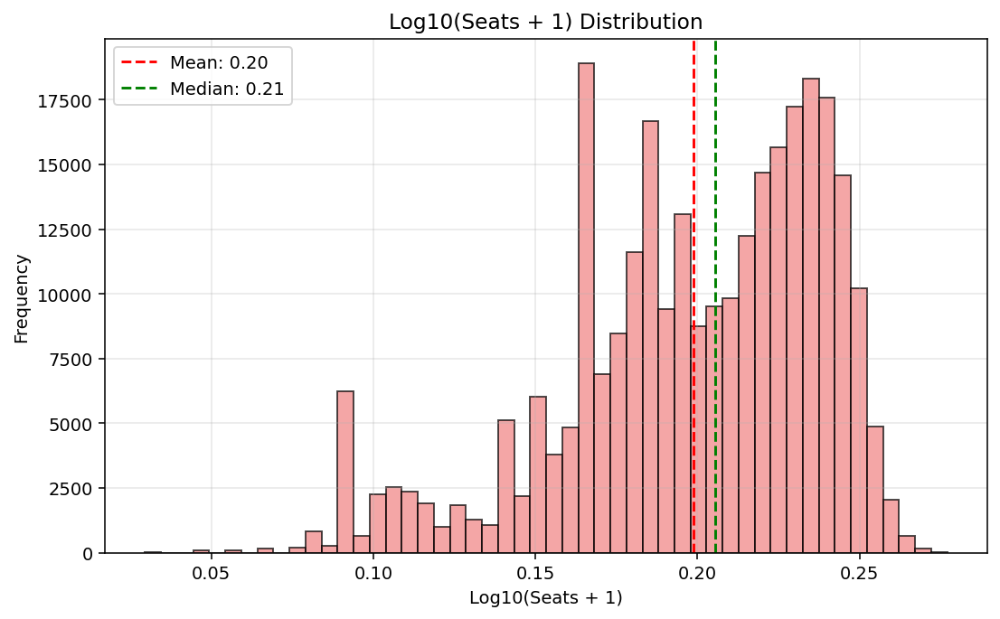

LOG TRANSFORMATION RESULTS:
Original skewness: -0.633
Log-transformed skewness: -0.843
Improvement: -0.210


In [ ]:
'''
Use GPT-5 to visualize the log transformation results. Sep.26.20:07
'''
df_sorted['log_seats'] = np.log10(df_sorted['seats'] + 1)

plt.figure(figsize=(8, 5))
plt.hist(df_sorted['log_seats'], bins=50, alpha=0.7, color='lightcoral', edgecolor='black')
plt.title('Log10(Seats + 1) Distribution')
plt.xlabel('Log10(Seats + 1)')
plt.ylabel('Frequency')
plt.axvline(df_sorted['log_seats'].mean(), color='red', linestyle='--',
           label=f'Mean: {df_sorted["log_seats"].mean():.2f}')
plt.axvline(df_sorted['log_seats'].median(), color='green', linestyle='--',
           label=f'Median: {df_sorted["log_seats"].median():.2f}')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

original_skew = df_sorted['seats'].skew()
log_skew = df_sorted['log_seats'].skew()

print("LOG TRANSFORMATION RESULTS:")
print(f"Original skewness: {original_skew:.3f}")
print(f"Log-transformed skewness: {log_skew:.3f}")
print(f"Improvement: {abs(original_skew) - abs(log_skew):.3f}")

In [ ]:
df_sorted['seats'] = np.log10(df_sorted['seats'] + 1)

**Categorical Variable Analysis**

I analyzed the distribution of categorical variables in the aviation dataset

- **departure_continent**: Flight origin regions (6 categories)
   - North America (NA): 44.1%, Europe (EU): 36.8%, Asia (AS): 13.2%, Africa (AF): 2.9%, South America (SA): 2.0%, Oceania (OC): 1.0%, showing strong geographic concentration in North America and Europe

- **domestic**: Route type classification (2 categories)  
   - Domestic flights (1): 51.2%, International flights (0): 48.8%. It is nearly balanced distribution with slight domestic preference

- **acft_class**: Aircraft type categories (9 classes)
   - Narrow Body (NB): 50.3%, Regional Jet (RJ): 15.5%, Unknown: 13.0%
   - Wide Body (WB): 9.2%, Turboprop (TP): 5.2%, Private Jet (PJ): 4.9%
   - The `Unknown` category (13%) is preserved to maintain real-world data completeness and avoid sample bias from excluding 37K+ observations
   - Box plot analysis reveals distinct flight distance patterns; Wide Body aircraft operate significantly longer routes compared to Turboprop and Regional Jets, while Private Jets show high variance reflecting diverse individual usage patterns
   - Helicopters (HE) represent a negligible portion (0.1%) and are not considered traditional aircraft


Categorical Variables Detail:

departure_continent: 6 unique categories
All categories:
  NA: 126,287 (44.1%)
  EU: 105,314 (36.8%)
  AS: 37,622 (13.2%)
  AF: 8,243 (2.9%)
  SA: 5,732 (2.0%)
  OC: 2,878 (1.0%)

domestic: 2 unique categories
All categories:
  1: 146,608 (51.2%)
  0: 139,468 (48.8%)

acft_class: 9 unique categories
All categories:
  NB: 143,804 (50.3%)
  RJ: 44,404 (15.5%)
  Unknown: 37,080 (13.0%)
  WB: 26,456 (9.2%)
  TP: 14,904 (5.2%)
  PJ: 13,876 (4.9%)
  PP: 5,220 (1.8%)
  HE: 238 (0.1%)
  OTHER: 94 (0.0%)

DATA DISTRIBUTION CHECK:
Departure continent distribution:
  AF: 8,243 (2.9%)
  AS: 37,622 (13.2%)
  EU: 105,314 (36.8%)
  NA: 126,287 (44.1%)
  OC: 2,878 (1.0%)
  SA: 5,732 (2.0%)
Debug - domestic values: domestic
1    146608
0    139468
Name: count, dtype: int64


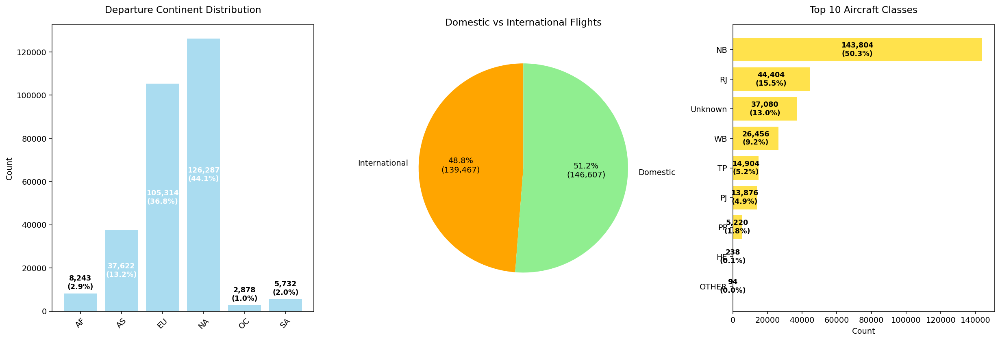

In [ ]:
'''
Use GPT-5 to visualize categorical variable distributions. Sep.26.20:40
'''

print("\nCategorical Variables Detail:")
for col in categorical_cols:
    n_unique = df_sorted[col].nunique(dropna=True)
    print(f"\n{col}: {n_unique} unique categories")

    if n_unique <= 10:
        print("All categories:")
        counts = df_sorted[col].value_counts(dropna=False)
        for cat, count in counts.items():
            pct = (count / len(df_sorted)) * 100
            print(f"  {cat}: {count:,} ({pct:.1f}%)")
    else:
        print("Top 10 categories:")
        top_cats = df_sorted[col].value_counts().head(10)
        for cat, count in top_cats.items():
            pct = (count / len(df_sorted)) * 100
            print(f"  {cat}: {count:,} ({pct:.1f}%)")
        remaining = n_unique - 10
        print(f"  ... and {remaining} more categories")

print("\n" + "=" * 50)
print("DATA DISTRIBUTION CHECK:")
print("=" * 50)

dep_counts = df_sorted['departure_continent'].value_counts().sort_index()
print("Departure continent distribution:")
for continent, count in dep_counts.items():
    pct = (count / len(df_sorted)) * 100
    print(f"  {continent}: {count:,} ({pct:.1f}%)")


fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 1. Departure Continent
bars_dept = axes[0].bar(dep_counts.index, dep_counts.values, color='skyblue', alpha=0.7)
axes[0].set_title('Departure Continent Distribution', fontsize=12, pad=15)
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=45)

# Add count and percentage labels on bars
for i, (bar, v) in enumerate(zip(bars_dept, dep_counts.values)):
    pct = (v / len(df_sorted)) * 100
    # Position label inside bar if bar is tall enough, otherwise above
    y_pos = v * 0.5 if v > max(dep_counts.values) * 0.1 else v + max(dep_counts.values) * 0.01
    text_color = 'white' if v > max(dep_counts.values) * 0.1 else 'black'
    va_align = 'center' if v > max(dep_counts.values) * 0.1 else 'bottom'

    axes[0].text(i, y_pos, f'{v:,}\n({pct:.1f}%)',
                ha='center', va=va_align, fontsize=9,
                color=text_color, weight='bold')

# 2. Domestic vs International (Pie Chart)
print("Debug - domestic values:", df_sorted['domestic'].value_counts())
domestic_counts = df_sorted['domestic'].value_counts().sort_index()

# Handle different data types (boolean, 0/1, string)
if len(domestic_counts) >= 2:
    keys = domestic_counts.index.tolist()
    values = domestic_counts.values.tolist()

    # Map to meaningful labels
    if keys[0] in [False, 0, '0', 'False', 'International']:
        domestic_labels = ['International', 'Domestic']
        domestic_values = [values[0], values[1] if len(values) > 1 else 0]
    else:
        domestic_labels = ['Domestic', 'International']
        domestic_values = [values[0], values[1] if len(values) > 1 else 0]
else:
    domestic_labels = ['International', 'Domestic']
    domestic_values = [domestic_counts.get(False, 0), domestic_counts.get(True, 0)]

# Create pie chart
colors = ['orange', 'lightgreen']
wedges, texts, autotexts = axes[1].pie(domestic_values, labels=domestic_labels, colors=colors,
                                       autopct=lambda pct: f'{pct:.1f}%\n({int(pct/100*len(df_sorted)):,})',
                                       startangle=90, textprops={'fontsize': 10})
axes[1].set_title('Domestic vs International Flights', fontsize=12, pad=15)

# 3. Top Aircraft Classes
top_classes = df_sorted['acft_class'].value_counts().head(10)
y_pos = np.arange(len(top_classes))
bars = axes[2].barh(y_pos, top_classes.values, color='gold', alpha=0.7)
axes[2].set_yticks(y_pos)
axes[2].set_yticklabels(top_classes.index)
axes[2].invert_yaxis()
axes[2].set_title('Top 10 Aircraft Classes', fontsize=12, pad=15)
axes[2].set_xlabel('Count')

# Add count and percentage labels INSIDE the bars
for i, (bar, value) in enumerate(zip(bars, top_classes.values)):
    pct = (value / len(df_sorted)) * 100
    # Position inside bar at 50% width for better visibility
    x_position = bar.get_width() * 0.5
    axes[2].text(x_position, bar.get_y() + bar.get_height()/2,
                 f'{value:,}\n({pct:.1f}%)',
                 ha='center', va='center', fontsize=9,
                 color='black', weight='bold')

plt.subplots_adjust(wspace=0.3, left=0.06, right=0.98, top=0.92, bottom=0.08)
plt.show()

In [ ]:
exclude = {"Unknown", "OTHER", "HE"}
df_plot = df_sorted[~df_sorted["acft_class"].isin(exclude)].copy()

order = (
    df_plot.groupby("acft_class")["distance_km"]
           .median()
           .sort_values()
           .index
           .tolist()
)

# 3) Box plot
fig = px.box(
    df_plot,
    x="acft_class",
    y="distance_km",
    points="outliers",
    title="Flight Distance by Aircraft Class",
    labels={"acft_class": "Aircraft Class", "distance_km": "Distance (km)"},
    template="plotly_white",
    category_orders={"acft_class": order},  # remove this line if you don't want sorting
)

fig.update_layout(
    yaxis_title="Distance (km)",
    xaxis_title="Aircraft Class",
    boxmode="group"
)

fig.show()

**Numerical Correlation Analysis**

I conducted correlation analysis between continuous variables in our aviation dataset. This is important because in the subsequent XAI analysis(PDP, ALE, ICE), understanding these relationships will guide our interpretation.

- **Continuous-Continuous (Pearson correlation: for linear relationships between continuous variables)**
    - seats - co2_per_distance: r = 0.288 (moderate positive correlation)
        - Larger aircraft (with more seats) tend to have higher CO2 emissions per km, suggesting less fuel efficiency
    - seats - distance_km: r = 0.120 (weak positive correlation)  
        - Slight tendency for larger aircraft to operate on longer routes, but the relationship is weak. This effect may be diluted because private jets are also operated for long-haul routes as observed in the box-plot
    - distance_km - co2_per_distance: r = -0.013 (negligible correlation)
        - No linear relationship between flight distance and fuel efficiency per km

- **Categorical-Categorical (Cramér's V: for bias-corrected measure for nominal categorical associations)**
    - domestic ↔ departure_continent: Cramér's V ≈ 0.58 (Strong)
        - Continental regions show distinctly different domestic/international flight ratios

- **Categorical-Continuous (Eta-squared η² for measuring variance explained by categorical predictors in continuous outcomes)**
    - acft_class - distance_km: η² = 0.536 (Strong)
        - Aircraft class explains **53.6%** of flight distance variation, representing the strongest structural relationship. Aircraft type serves as the primary determinant of operational patterns
    - domestic - distance_km: η² = 0.134 (Moderate)
        - Route type (domestic/international) explains 13.4% of distance variation

In [ ]:
df_sorted[numeric_cols].corr()

,seats,co2_per_distance,distance_km
seats,1.000000,0.288223,0.120262
co2_per_distance,0.288223,1.000000,-0.013171
distance_km,0.120262,-0.013171,1.000000


**Categorical Correlation**

In [ ]:
'''
Use GPT-5 to visualize categorical variable distributions. Sep.26.21:50
'''

cats = ['departure_continent', 'domestic', 'acft_class']

def cramers_v_bias_corrected(x, y):
    cm = pd.crosstab(x, y)
    chi2 = chi2_contingency(cm, correction=False)[0]
    n = cm.values.sum()
    r, k = cm.shape
    phi2 = chi2 / n
    phi2_corr = max(0, phi2 - (k-1)*(r-1)/(n-1))
    r_corr = r - (r-1)**2/(n-1)
    k_corr = k - (k-1)**2/(n-1)
    denom = min(k_corr-1, r_corr-1)
    return np.sqrt(phi2_corr / denom) if denom > 0 else 0.0

M = pd.DataFrame(index=cats, columns=cats, dtype=float)
for a in cats:
    for b in cats:
        M.loc[a,b] = 1.0 if a==b else cramers_v_bias_corrected(df_sorted[a], df_sorted[b])

print(M.round(3))


                     departure_continent  domestic  acft_class
departure_continent                1.000     0.582       0.306
domestic                           0.582     1.000       0.357
acft_class                         0.306     0.357       1.000


**Mixed Correlation**
- *Note: I set the α-tapered weights (α = 0.5) introduced in the case summary earlier. Details are provided in in the following modeling section*

/var/folders/x0/gkxw33gj58n2ptpf02t8_ncr0000gn/T/ipykernel_52517/2985608586.py:32: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/x0/gkxw33gj58n2ptpf02t8_ncr0000gn/T/ipykernel_52517/2985608586.py:32: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/x0/gkxw33gj58n2ptpf02t8_ncr0000gn/T/ipykernel_52517/2985608586.py:32: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping 

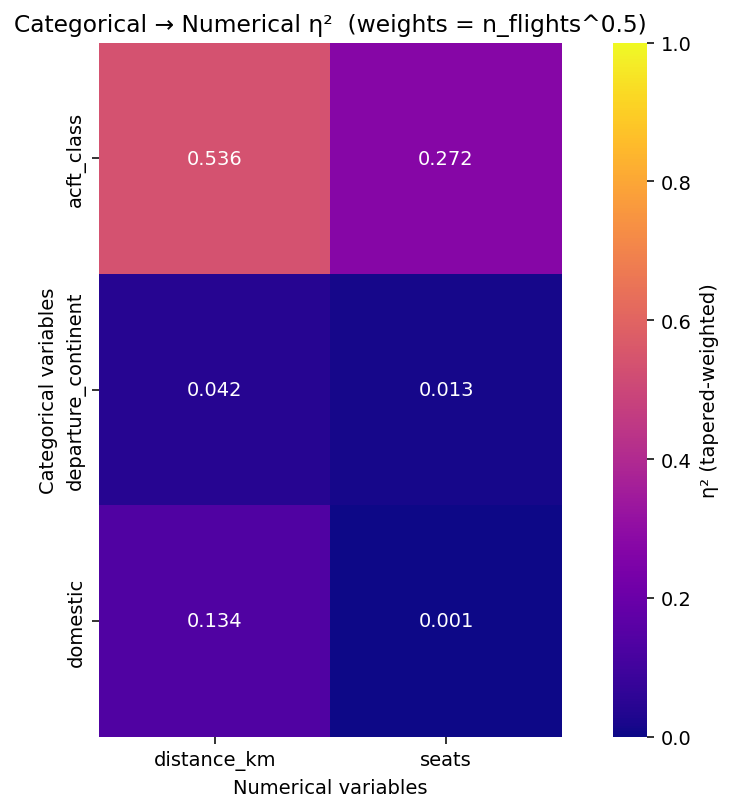

/var/folders/x0/gkxw33gj58n2ptpf02t8_ncr0000gn/T/ipykernel_52517/2985608586.py:32: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



        Categorical  η² vs co2_per_distance
           domestic                0.024381
departure_continent                0.011384
         acft_class                0.010183


/var/folders/x0/gkxw33gj58n2ptpf02t8_ncr0000gn/T/ipykernel_52517/2985608586.py:32: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/x0/gkxw33gj58n2ptpf02t8_ncr0000gn/T/ipykernel_52517/2985608586.py:32: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [ ]:
'''
Use GPT-5 to visualize categorical variable distributions. Sep.26.22:32
'''

# --- taper settings (match your RF training) ---
ALPHA = 0.5        # e.g., 0.3–0.7
CAP   = None       # e.g., 5000 or None

# --- choose raw weights from the original frame, aligned to df_sorted ---
# (df_sorted usually does NOT contain 'n_flights'; pull from df_temp and align by index)
w_raw = df.loc[df.index, 'n_flights'].astype(float)

# --- tapered weights: n_flights**ALPHA with optional cap ---
w_taper = np.power(w_raw, ALPHA)
if CAP is not None:
    w_taper = np.minimum(w_taper, CAP)

# --- helper: weighted eta-squared (categorical -> numeric) ---
def eta2_weighted(categories, values, weights=None):
    s = pd.Series(values); c = pd.Series(categories)
    w = pd.Series(1.0, index=s.index) if weights is None else pd.Series(weights).loc[s.index]
    # overall weighted mean
    mu = np.average(s, weights=w)
    # total SS
    ss_total = np.sum(w * (s - mu)**2)
    if ss_total <= 0:
        return 0.0
    # group stats
    tmp = pd.DataFrame({'c': c, 'v': s, 'w': w})
    g = tmp.groupby('c', observed=True)
    w_sum  = g['w'].sum()
    w_mean = g.apply(lambda x: np.average(x['v'], weights=x['w']))
    # between-group SS
    ss_between = np.sum(w_sum * (w_mean - mu)**2)
    return float(ss_between / ss_total)

# --- build η² matrix (exclude target from grid if desired) ---
exclude = {'co2_per_distance'}                  # set() if you want to include target too
num_for_grid = [n for n in numeric_cols if n not in exclude]

rows = []
for cat in categorical_cols:
    for num in num_for_grid:
        eta2 = eta2_weighted(df_sorted[cat], df_sorted[num], weights=w_taper)
        rows.append([cat, num, eta2])

eta_df = pd.DataFrame(rows, columns=['Categorical','Numerical','Eta2'])
M = eta_df.pivot(index='Categorical', columns='Numerical', values='Eta2')

# --- single heatmap ---
plt.figure(figsize=(1.8*len(M.columns)+4, 1.3*len(M.index)+2))
sns.heatmap(M, annot=True, fmt='.3f', cmap='plasma', vmin=0, vmax=1, square=True,
            cbar_kws={'label': 'η² (tapered-weighted)'})
plt.title(f'Categorical → Numerical η²  (weights = n_flights^{ALPHA}' + (f', cap={CAP}' if CAP is not None else '') + ')')
plt.xlabel('Numerical variables'); plt.ylabel('Categorical variables')
plt.tight_layout(); plt.show()

# --- (optional) tiny target-only table, same tapered weights ---
target = 'co2_per_distance'
target_eta = []
for cat in categorical_cols:
    target_eta.append([cat, eta2_weighted(df_sorted[cat], df_sorted[target], weights=w_taper)])
target_df = (pd.DataFrame(target_eta, columns=['Categorical', f'η² vs {target}'])
               .sort_values(by=f'η² vs {target}', ascending=False))
print(target_df.to_string(index=False))


----

#### **Model Development**

**Random Forest Model Results**

I implemented a Random Forest regressor with tapered weighting strategy to balance high-traffic route performance with diverse route coverage.

**Model Configuration**
- **Algorithm**: Random Forest with 16 trees (optimized via validation sweep)
- **Features**: Aircraft class, departure continent, seats, distance_km, domestic/international classification
- **Weighting Strategy**: Tapered weights using n_flights^0.5 to emphasize high-traffic routes while maintaining diversity

**Performance Results**

- **Tapered-weighted evaluation** showed R² = 0.971, RMSE = 1782.5 CO₂/km, MAE = 770.7  
  - Reflects the training objective balancing commercial impact with coverage
  - Comparied to unweighted and every flight counts equally weighted Tapered-weighted model showed robust and balanced performance
  - This model configuration provides a solid foundation for reliable XAI analysis across different flight segments

In [ ]:
'''
Use GPT-5 to visualize categorical variable distributions. Sep.26.22:32
'''

# -*- coding: utf-8 -*-
# Tapered-weight Random Forest (leakage-safe by aircraft type)
# - Groups = acft_icao (prevents type leakage)
# - Features include acft_class (7-class airframe/body)
# - Tapered weights: w_t = n_flights ** ALPHA (optional CAP)
# - Coarse warm-start sweep ONLY (no local refinement)
# - Final train on train+val, single evaluation on test
# - Saves pipeline + raw & grouped feature importances

# -----------------------
# Config: tapered weights
# -----------------------
ALPHA = 0.5   # 0.3–0.7 are reasonable; higher -> more fleet emphasis, lower -> more diversity
CAP   = None  # e.g., 5000 to clip extreme weights; keep None if not needed
RANDOM_STATE_SWEEP = 42
RANDOM_STATE_INNER = 43

ARTIFACT_DIR = "/Users/ilseoplee/XAI_AIPI590.01_2025Fall/Week5_artifacts"
MODEL_DIR    = os.path.join(ARTIFACT_DIR, "models")
os.makedirs(MODEL_DIR, exist_ok=True)

# -----------------------
# Helpers
# -----------------------
def rmse(y_true, y_pred, sample_weight=None):
    return np.sqrt(mean_squared_error(y_true, y_pred, sample_weight=sample_weight))

def make_tapered_weights(w_raw: pd.Series, alpha: float = 0.5, cap: float | None = None) -> pd.Series:
    w_t = np.power(w_raw.astype(float), alpha)
    if cap is not None:
        w_t = np.minimum(w_t, cap)
    return w_t

# -----------------------
# 0) Build modeling frame
# -----------------------
def build_model_frame(df: pd.DataFrame):
    df_temp = df.copy()
    df_temp = df_temp.replace([np.inf, -np.inf], np.nan)
    required = ['co2','distance_km','n_flights','acft_icao','acft_class',
                'departure_continent','seats','domestic']
    missing = [c for c in required if c not in df_temp.columns]
    if missing:
        raise ValueError(f"Missing required columns: {missing}")

    df_temp = df_temp.dropna(subset=required)
    df_temp = df_temp[(df_temp['distance_km'] > 0) & (df_temp['n_flights'] > 0)].copy()

    # target
    df_temp['co2_per_distance'] = df_temp['co2'] / df_temp['distance_km']

    # deduplicate to avoid accidental double-counting aggregated rows
    df_temp = df_temp.drop_duplicates()

    # Keep acft_icao for grouping; use acft_class as feature
    cols = ['departure_continent','seats','distance_km','domestic',
            'acft_class','acft_icao','co2_per_distance']
    df_sorted = df_temp[cols].copy()
    return df_temp, df_sorted

# -----------------------
# 1) Data prep
# -----------------------
# Expect user to provide df externally
df_temp, df_sorted = build_model_frame(df)

X = df_sorted[['departure_continent','seats','distance_km','domestic','acft_class']].copy()
y = df_sorted['co2_per_distance'].copy()

# raw fleet weights and tapered weights
w_raw = df_temp.loc[df_sorted.index, 'n_flights'].astype(float)
assert len(w_raw) == len(X) and w_raw.isna().sum() == 0 and (w_raw > 0).all()
w_taper = make_tapered_weights(w_raw, alpha=ALPHA, cap=CAP)

# leakage-safe by TYPE (group key only; not in X)
groups = df_sorted['acft_icao'].astype(str)

# -----------------------
# 2) Group-aware splits
# -----------------------
gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=RANDOM_STATE_SWEEP)
tr_idx, te_idx = next(gss.split(X, y, groups=groups))

X_train_val, X_test = X.iloc[tr_idx], X.iloc[te_idx]
y_train_val, y_test = y.iloc[tr_idx], y.iloc[te_idx]
w_raw_train_val, w_raw_test     = w_raw.iloc[tr_idx],  w_raw.iloc[te_idx]
w_taper_train_val, w_taper_test = w_taper.iloc[tr_idx], w_taper.iloc[te_idx]

gss2 = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=RANDOM_STATE_INNER)
tr2, va2 = next(gss2.split(X_train_val, y_train_val, groups=groups.iloc[tr_idx]))
X_train, X_val = X_train_val.iloc[tr2], X_train_val.iloc[va2]
y_train, y_val = y_train_val.iloc[tr2], y_train_val.iloc[va2]
w_taper_train, w_taper_val = w_taper_train_val.iloc[tr2], w_taper_train_val.iloc[va2]

# -----------------------
# 3) Pipeline (preprocess + RF)
# -----------------------
num_cols = ['seats','distance_km']
cat_cols = ['departure_continent','domestic','acft_class']

pre = ColumnTransformer([
    ('num', 'passthrough', num_cols),
    ('cat', OneHotEncoder(handle_unknown='ignore', drop=None), cat_cols),
])

rf_warm = RandomForestRegressor(
    n_estimators=1, warm_start=True, random_state=RANDOM_STATE_SWEEP, n_jobs=-1
)
pipe_warm = Pipeline([('pre', pre), ('rf', rf_warm)])

# -----------------------
# 4) Coarse warm-start sweep (tapered weights)
# -----------------------
val_curve = []
best_n, best_rmse = None, np.inf

print("\n[Coarse sweep - tapered weights]")
for n in range(1, 101, 5):  # 1, 6, 11, ..., 96
    pipe_warm.set_params(rf__n_estimators=n)
    pipe_warm.fit(X_train, y_train, rf__sample_weight=w_taper_train)
    preds_val = pipe_warm.predict(X_val)
    v_rmse = rmse(y_val, preds_val, sample_weight=w_taper_val)
    val_curve.append((n, v_rmse))
    if v_rmse < best_rmse:
        best_rmse, best_n = v_rmse, n
    print(f"Trees: {n:3d} | Val RMSE (tapered-w): {v_rmse:.4f}")

print(f"\nChosen n_estimators = {best_n} (Val RMSE tapered={best_rmse:.4f}; alpha={ALPHA}, cap={CAP})")

# -----------------------
# 5) Final fit on TRAIN+VAL; triple TEST eval
# -----------------------
final = Pipeline([
    ('pre', pre),
    ('rf', RandomForestRegressor(n_estimators=best_n, random_state=RANDOM_STATE_SWEEP, n_jobs=-1))
])
final.fit(X_train_val, y_train_val, rf__sample_weight=w_taper_train_val)

y_test_pred = final.predict(X_test)

# (a) Unweighted view (per observation)
test_r2_unw   = r2_score(y_test, y_test_pred)
test_rmse_unw = rmse(y_test, y_test_pred)
test_mae_unw  = mean_absolute_error(y_test, y_test_pred)

# (b) Tapered-weighted view (training objective)
test_r2_tap   = r2_score(y_test, y_test_pred, sample_weight=w_taper_test)
test_rmse_tap = rmse(y_test, y_test_pred, sample_weight=w_taper_test)
test_mae_tap  = mean_absolute_error(y_test, y_test_pred, sample_weight=w_taper_test)

# (c) Fleet-weighted view (original n_flights; business comparability)
test_r2_w   = r2_score(y_test, y_test_pred, sample_weight=w_raw_test)
test_rmse_w = rmse(y_test, y_test_pred, sample_weight=w_raw_test)
test_mae_w  = mean_absolute_error(y_test, y_test_pred, sample_weight=w_raw_test)

print("\n=== TEST (unweighted) ===")
print(f"R²   : {test_r2_unw:.4f}")
print(f"RMSE : {test_rmse_unw:.4f}")
print(f"MAE  : {test_mae_unw:.4f}")

print("\n=== TEST (tapered weights, alpha={ALPHA}, cap={CAP}) ===")
print(f"R²_t : {test_r2_tap:.4f}")
print(f"RMSE_t : {test_rmse_tap:.4f}")
print(f"MAE_t  : {test_mae_tap:.4f}")

print("\n=== TEST (fleet-weighted, original n_flights) ===")
print(f"R²_w : {test_r2_w:.4f}")
print(f"RMSE_w : {test_rmse_w:.4f}")
print(f"MAE_w  : {test_mae_w:.4f}")
print(f"(Best Val RMSE from sweep (tapered): {best_rmse:.4f} at n={best_n})")

# -----------------------
# 6) Save full pipeline + feature importances
# -----------------------
stamp = datetime.datetime.utcnow().strftime("%Y%m%dT%H%M%SZ")
model_path = os.path.join(ARTIFACT_DIR, f"rf_aircraft_pipeline_non_weighted_{stamp}.joblib")
joblib.dump(final, model_path)
print(f"\nSaved model to: {model_path}")

# Extract post-OHE feature names
rf = final.named_steps['rf']
pre_fitted = final.named_steps['pre']
ohe = pre_fitted.named_transformers_['cat']
cat_names = ohe.get_feature_names_out(cat_cols).tolist()
all_feature_names = num_cols + cat_names

# Raw (post-OHE) importances
if hasattr(rf, "feature_importances_") and len(rf.feature_importances_) == len(all_feature_names):
    feat_imp = (pd.DataFrame({"Feature": all_feature_names,
                              "Importance": rf.feature_importances_})
                .sort_values("Importance", ascending=False))
    csv_raw = os.path.join(ARTIFACT_DIR, f"feature_importances_raw_non_weighted_{stamp}.csv")
    feat_imp.to_csv(csv_raw, index=False)
    print(f"Saved raw (post-OHE) importances to: {csv_raw}")

    # Grouped importances by original feature (sum of child OHE cols)
    group_map = {
        'seats': ['seats'],
        'distance_km': ['distance_km'],
        'departure_continent': [c for c in all_feature_names if c.startswith('departure_continent_')],
        'domestic': [c for c in all_feature_names if c.startswith('domestic_')],
        'acft_class': [c for c in all_feature_names if c.startswith('acft_class_')],
    }
    grouped_rows = []
    for orig, cols in group_map.items():
        imp_sum = feat_imp.loc[feat_imp['Feature'].isin(cols), 'Importance'].sum()
        grouped_rows.append((orig, imp_sum))
    feat_imp_grouped = (pd.DataFrame(grouped_rows, columns=['OriginalFeature','GroupedImportance'])
                        .sort_values('GroupedImportance', ascending=False))
    csv_grp = os.path.join(ARTIFACT_DIR, f"feature_importances_grouped_non_weighted_{stamp}.csv")
    feat_imp_grouped.to_csv(csv_grp, index=False)
    print(f"Saved grouped (by original feature) importances to: {csv_grp}")



[Coarse sweep - tapered weights]
Trees:   1 | Val RMSE (tapered-w): 2186.7267
Trees:   6 | Val RMSE (tapered-w): 2006.3660
Trees:  11 | Val RMSE (tapered-w): 1985.3599
Trees:  16 | Val RMSE (tapered-w): 1959.1738
Trees:  21 | Val RMSE (tapered-w): 2176.5099
Trees:  26 | Val RMSE (tapered-w): 2115.3531
Trees:  31 | Val RMSE (tapered-w): 2093.3682
Trees:  36 | Val RMSE (tapered-w): 2059.2856
Trees:  41 | Val RMSE (tapered-w): 2038.1322
Trees:  46 | Val RMSE (tapered-w): 2148.1185
Trees:  51 | Val RMSE (tapered-w): 2127.3310
Trees:  56 | Val RMSE (tapered-w): 2095.6339
Trees:  61 | Val RMSE (tapered-w): 2094.1439
Trees:  66 | Val RMSE (tapered-w): 2077.0733
Trees:  71 | Val RMSE (tapered-w): 2074.3233
Trees:  76 | Val RMSE (tapered-w): 2081.7012
Trees:  81 | Val RMSE (tapered-w): 2076.4212
Trees:  86 | Val RMSE (tapered-w): 2076.0949
Trees:  91 | Val RMSE (tapered-w): 2064.6637
Trees:  96 | Val RMSE (tapered-w): 2060.4620

Chosen n_estimators = 16 (Val RMSE tapered=1959.1738; alpha=0.5, 

/var/folders/x0/gkxw33gj58n2ptpf02t8_ncr0000gn/T/ipykernel_52517/3437138034.py:187: DeprecationWarning:

datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).



**Feature Importance**

- I found that seats dominates feature importance (0.90), with distance_km ranking second. However, the seats feature essentially represents aircraft capacity, which is determined by aircraft design. Therefore, I selected distance_km instead of seats. This choice will also help clarify the impact on CO2/km, which is otherwise unclear due to the correlation between distance_km and aircraft type (icao_acft).

In [ ]:
'''
Use GPT-5 to visualize categorical variable distributions. Sep.26.23:42
'''

MODEL_PATH = "/Users/ilseoplee/XAI_AIPI590.01_2025Fall/Week5_artifacts/rf_aircraft_pipeline_non_weighted_20250927T055832Z.joblib"
pipe = joblib.load(MODEL_PATH)  # expects steps: pre (ColumnTransformer) + rf (RandomForest*)

# Columns (same as training)
num_cols = ['seats','distance_km']
cat_cols = ['departure_continent','domestic','acft_class']

# --- Post-OHE feature names ---
pre = pipe.named_steps['pre']
ohe = pre.named_transformers_['cat']
feat_names = num_cols + ohe.get_feature_names_out(cat_cols).tolist()

# --- (A) Impurity-based importance (fast) ---
rf = pipe.named_steps['rf']
imp = (pd.DataFrame({"Feature": feat_names, "Importance": rf.feature_importances_})
       .sort_values("Importance", ascending=False)
       .reset_index(drop=True))
imp["Importance_norm"] = imp["Importance"] / imp["Importance"].sum()
display(imp.head(20))

# --- (B) Grouped importance (sum OHE back to original features) ---
group_map = {
    "seats": ["seats"],
    "distance_km": ["distance_km"],
    "departure_continent": [c for c in feat_names if c.startswith("departure_continent_")],
    "domestic": [c for c in feat_names if c.startswith("domestic_")],
    "acft_class": [c for c in feat_names if c.startswith("acft_class_")],
}
rows = []
for g, cols in group_map.items():
    rows.append((g, imp.loc[imp["Feature"].isin(cols), "Importance"].sum()))
imp_grouped = (pd.DataFrame(rows, columns=["OriginalFeature","GroupedImportance"])
               .sort_values("GroupedImportance", ascending=False)
               .reset_index(drop=True))
imp_grouped["GroupedImportance_norm"] = imp_grouped["GroupedImportance"] / imp_grouped["GroupedImportance"].sum()
display(imp_grouped)

,Feature,Importance,Importance_norm
0,seats,9.013599e-01,9.013599e-01
1,distance_km,8.906453e-02,8.906453e-02
2,acft_class_RJ,4.284870e-03,4.284870e-03
3,acft_class_NB,2.012939e-03,2.012939e-03
4,acft_class_TP,1.035368e-03,1.035368e-03
5,departure_continent_NA,5.159220e-04,5.159220e-04
6,departure_continent_EU,4.616456e-04,4.616456e-04
7,acft_class_WB,2.811747e-04,2.811747e-04
8,acft_class_Unknown,2.386023e-04,2.386023e-04
9,domestic_0,1.851132e-04,1.851132e-04


,OriginalFeature,GroupedImportance,GroupedImportance_norm
0,seats,0.901360,0.901360
1,distance_km,0.089065,0.089065
2,acft_class,0.007907,0.007907
3,departure_continent,0.001349,0.001349
4,domestic,0.000320,0.000320


---

#### **Explainability**

(1)Provide a comprehensive explanation of your plots.<br> (2)Discuss any interesting findings that are shown in the plots.<br> (3)Discuss any differences you see in the PDP and ALE plots.<br> (4)Discuss your exploratory findings around correlation between features and the impact this has (if any) on your results.

**Distance_km and acft_class**

- As discussed in the feature importance, I focus on the distance_km. With PDP/ALE/ICE, I quantify its marginal effect of target variable(co2_per_distance), veryfying stage-length efficeincy, and present class statified views to respect feasible ranges.

    - PDP: depicts the global average response but can be biased under feature correlation because it perturbs the target feature across all observations, creating out-of-distribution combinations.

    - ALE: reduces this bias by estimating local, in-distribution differences within feature bins, typically yielding smoother, less extreme curves, especially at the tails, while agreeing with PDP where data density is high.
    
    - ICE: shows instance-level heterogeneity; crossing or fanning curves flag interactions and non-additivity, whereas tight, parallel curves suggest a stable main effect.

**Global PDP, ALE, Class-stratified PDP, Per-Class ALE and ICE**

**(1) Comprehensive explanations of the plots**

- **Global PDP — distance_km**: This curve shows the averaged predicted co2_per_distance when distance_km is varied for all rows. Very steep drop for short-haul flights, a small mid-range bump as the curve transitions across class mixes, and then a long flag segment. Because PDP overwrite distance_km for every row, so it creates unrealistic class-distance pairs(e.g., Regional Jet with over 10K km, which is not observed in the exploratory box plot)

- **Global ALE — distance_km**: ALE estimates local effect using real observation that is robust to feature correlation unlike PDP that overwrites unrealistic values sometimes. The result shows strong negative(Low Co2/km) effect from very short haul, a mid-range floor, and then a gentle increase in the far tail.

- **Class-stratified PDP — acft_class × distance_km**: These charts are computed within each aircraft class that have enough observation (> 1000 rows, excluding HE, OTHERS). This respects feasible ranges and exposes class averages.
NB/WB shares the spike-then-flatten pattern, whereas RJ shows drops early, shows small rebound and then declines. PJ looks volitile due to the insufficient sample sizes.

- **Per-Class ALE — distance_km | acft_class**: These are within-class, in-distribution distance effect, giving a cleaner read on distance_km × class interactions. NB shows strong negative slope through ~2~3k km then slight up. TP shows similar shape, but decline faster until 800K km, then a broad plateau. WB is negative until 2-3k km, then flat to 7k, and surged after 8K km

- **ICE**: Each faint line is one observation's predicted trajectory as distance varies. Lines are centered. so it focuses on shape, not level. Lines disperse in the long-haul region, and little converged in long-haul tails. The mean of ICE curves should match the PDP. However, mismatches happens because of different grid/resolutions and others.


**(2) Intersting findings from the plots**

- Short-haul inefficiency, mid-range floor, and tail heterogeneity: Both PDP and ALE show high CO2/km in very short distances region, a decline toward a mid-range floor, and long-haul tail depends on class (e.g., WB shows a clear uptrend)

- Global curves hide meaningful between-class structure: NB/WB/TP have steep short-haul drops, but PP/RJ flatten earlier. WB shows a long-haul uptick (NB is milder).

- ICE based trust region estimation: Below ~400 km, ICE lines diverge. It means different rows disagree about the direction/size of the effect at the same distance, so this zone is less reliable. However, in the 500~3,000km band looks more converged and PDP = ALE, indicating dense data coverage and consitent.


**(3) PDP vs ALE**

- As mentioned above, PDP shows a steep short-haul drop, a transient bump, and a plateau. ALE shows a more monotonic drop that stabilizes, then a modest rise. This is due to differnt methdology;
    - PDP (global perturbation): injects a wide range of distance_km values into every row, creating many out-of-distribution class–distance pairs.
    - ALE (local differences within bins): computes effects from changes at bin edges using observed neighborhoods, which greatly limits unrealistic combinations

- In the 500~3,000km band, PDP and ALE look similar. That's because this band have lots of real, in-distribution data.In short, plenty of typical distance-class cases shows stable output.


**(4)Discuss your exploratory findings around correlation between features and the impact**

- distance_km is strongly coupled with aircraft class(acft_class - distance_km: η² = 0.536). Distance is tightly linked with aircraft class, so only certain distance–class combinations are common in the data. Nevertheless, PDP breaks this structure by forcing every row to every distance, creating unrealistic pairs (e.g., RJ at 9,000 km or WB at 150 km) that causes short-haul spikes and cause mid/long-tail wiggles or upticks. In contrast, ALE looks only at small, real shifts within the data (nearby bins that actually exist). Because it stays in-distribution, those unrealistic patterns are largely removed, revealing the trur pattern; a smooth short-haul decline that plateaus.

- As alrady stated in (3), ICE backs this up. Below ~500 km the centered lines spread and cross, showing heterogeneous, low-support behavior across classes and missions, whereas in the well-supported 500–3,000 km band the lines are tight and nearly parallel, so both PDP and ALE agree and the distance effect is stable.

Plot classes: ['NB', 'WB', 'TP']


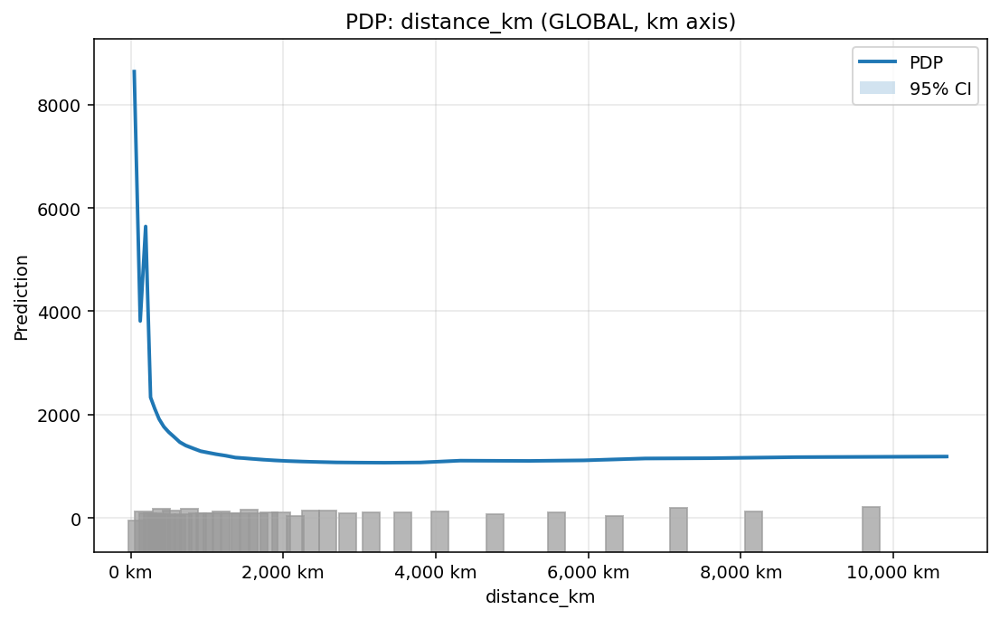

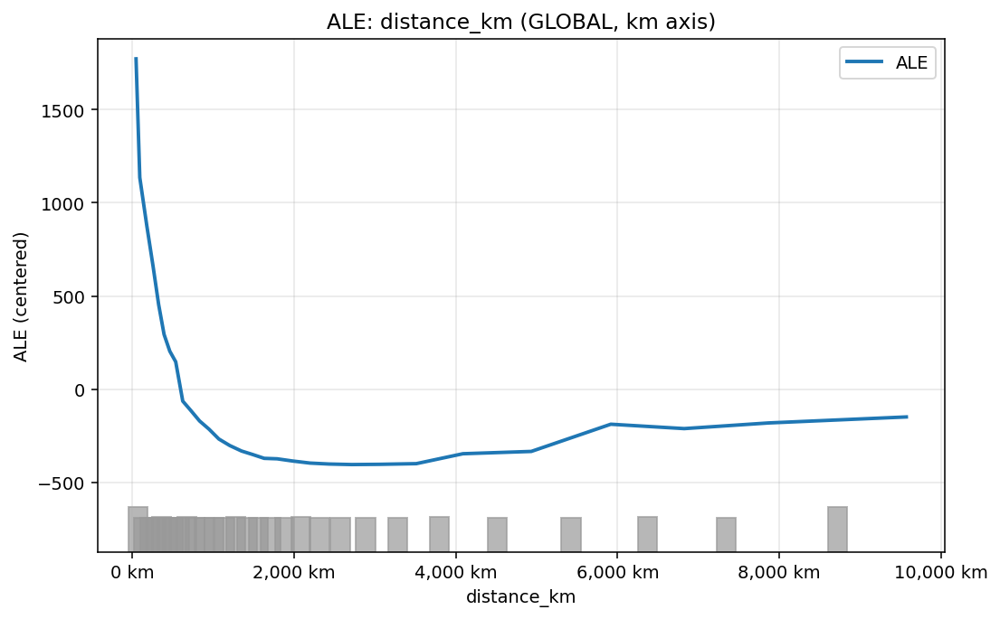

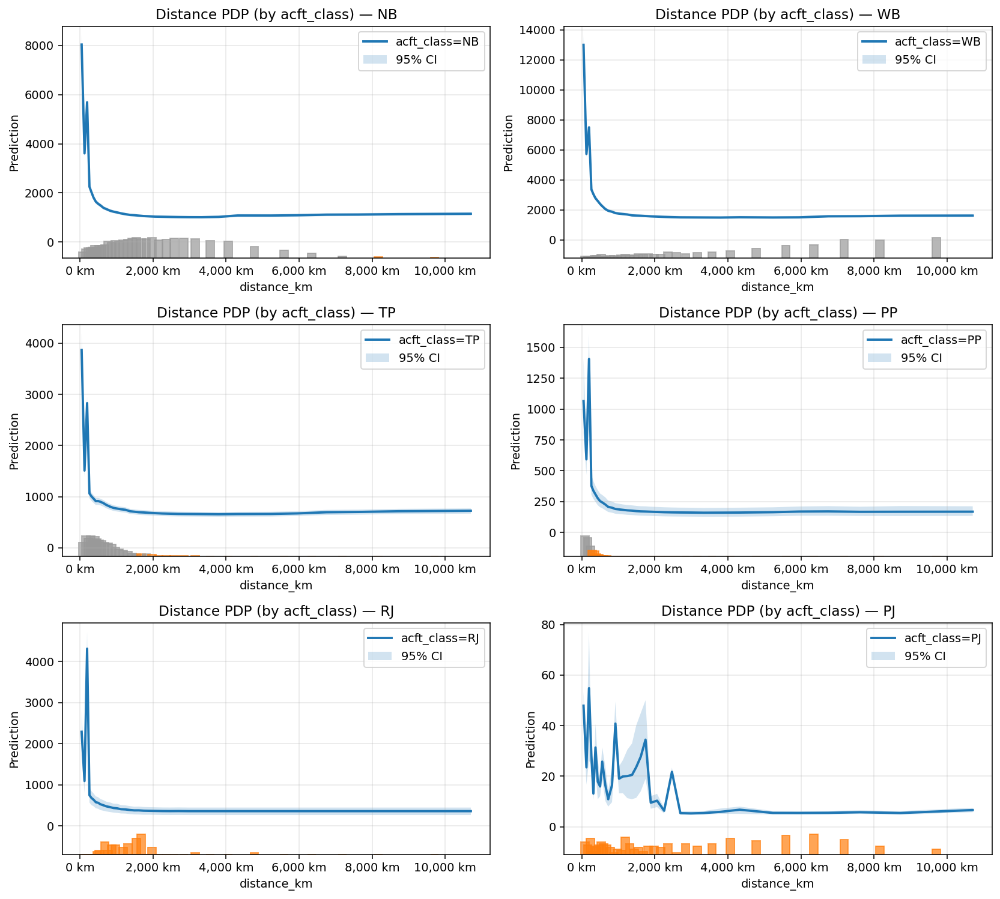

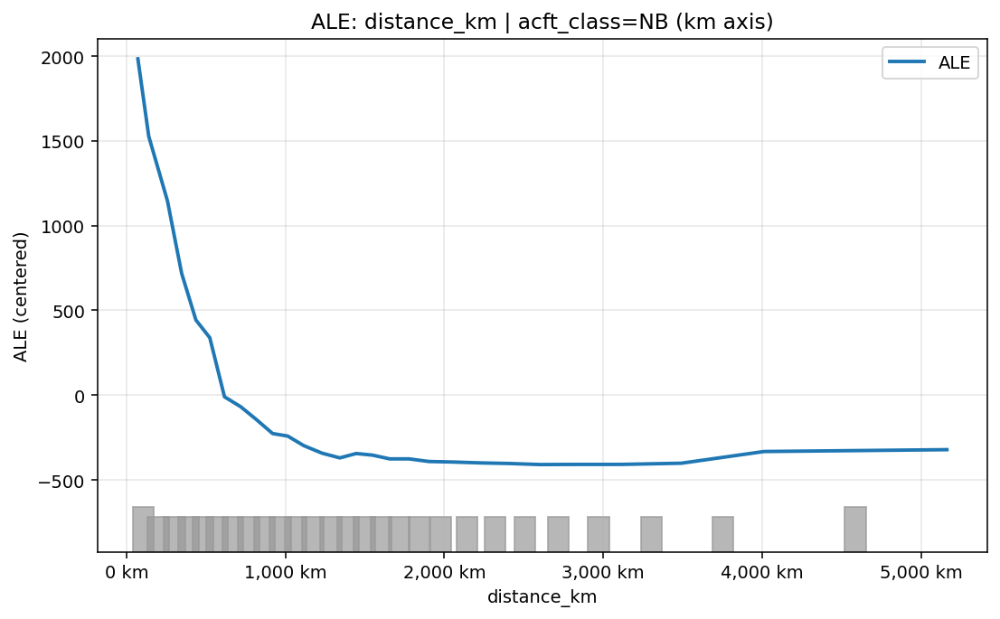

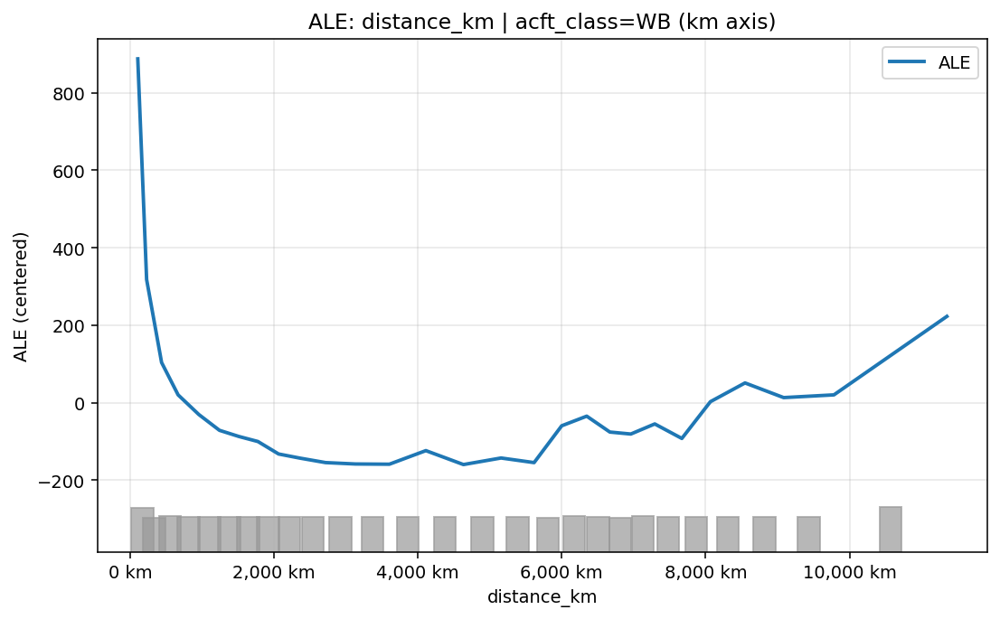

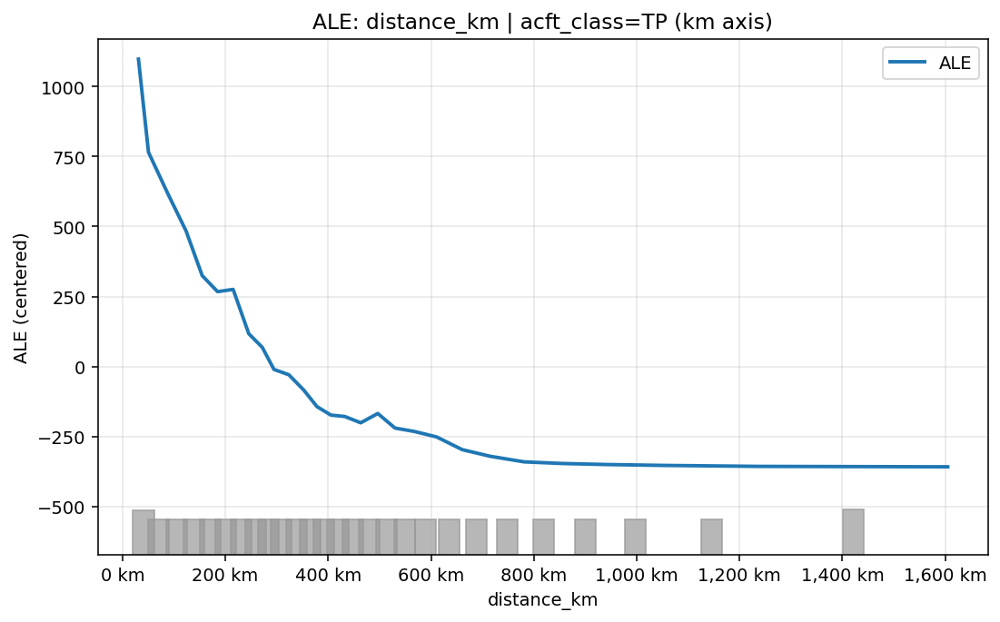

In [ ]:
'''
Use GPT-5 to visualize categorical variable distributions. Sep.27.10:30
'''

plt.rcParams["figure.dpi"] = 140

MODEL_PATH = "/Users/ilseoplee/XAI_AIPI590.01_2025Fall/Week5_artifacts/rf_aircraft_pipeline_non_weighted_20250927T055832Z.joblib"
assert os.path.exists(MODEL_PATH), f"Model not found: {MODEL_PATH}"
model = joblib.load(MODEL_PATH)

def _predict(m, X):
    return m.predict_proba(X)[:,1] if hasattr(m, "predict_proba") else m.predict(X)

# === 1) Expect X_test already in memory (built the same way as training features) ===
needed = ['distance_km','seats','acft_class','departure_continent','domestic']
missing = [c for c in needed if c not in X_test.columns]
assert not missing, f"Missing columns in X_test: {missing}"

# (optional) distance quartiles for later analyses; harmless to have here
X_test = X_test.copy()
if 'dist_q' not in X_test.columns:
    X_test['dist_q'] = pd.qcut(X_test['distance_km'], 4, labels=['Q1','Q2','Q3','Q4'])

# === 2) Plot helpers ===
def km_fmt(x, pos):
    try:    return f"{int(round(x)):,} km"
    except: return f"{x:.0f} km"

def quantile_grid(a, q=35, clip=(0.01,0.99)):
    a = np.asarray(a)
    lo, hi = np.quantile(a[~np.isnan(a)], clip)
    return np.quantile(a[(a>=lo)&(a<=hi)], np.linspace(0,1,q))

def bin_support(x, grid):
    bins = np.r_[-np.inf, (grid[:-1] + grid[1:]) / 2, np.inf]
    counts, _ = np.histogram(x, bins=bins)
    mids = (grid[:-1] + grid[1:]) / 2
    return counts, mids

def draw_support_bars(ax, mids, counts, y_min, y_max, thresh=50):
    support_height = 0.10*(y_max-y_min); y0 = y_min - 0.15*(y_max-y_min)
    if counts.sum() > 0:
        bar_w = (mids.max() - mids.min()) / max(1, (len(mids)*1.25))
        for m,c in zip(mids, counts):
            h = support_height * (c / counts.max()) if counts.max()>0 else 0
            color = "#999999" if c >= thresh else "#ff7f0e"
            ax.add_patch(plt.Rectangle((m-bar_w/2, y0), bar_w, h, color=color, alpha=0.7))
        ax.set_ylim(y0, y_max)

def pdp_1d(model, X, feature, q=35, clip=(0.01,0.99), logx=False, n_boot=100, ci=0.95, support_thresh=50, title=None):
    grid = quantile_grid(X[feature].to_numpy(), q=q, clip=clip)
    vals = np.zeros_like(grid, dtype=float)
    base = X.copy()
    for i,g in enumerate(grid):
        Xi = base.copy(); Xi[feature] = g
        vals[i] = _predict(model, Xi).mean()

    lower=upper=None
    if n_boot:
        rng = np.random.RandomState(42)
        boot = np.zeros((n_boot,len(grid)))
        for b in range(n_boot):
            Xb = resample(X, replace=True, random_state=rng.randint(0,10**9))
            for i,g in enumerate(grid):
                Xbi = Xb.copy(); Xbi[feature]=g
                boot[b,i] = _predict(model, Xbi).mean()
        alpha = 1-ci
        lower = np.quantile(boot, alpha/2, axis=0)
        upper = np.quantile(boot, 1-alpha/2, axis=0)

    x_plot = np.log1p(grid) if logx else grid
    xlab   = f"log1p({feature})" if logx else feature
    counts, mids = bin_support(X[feature].to_numpy(), grid)

    fig, ax = plt.subplots(figsize=(8,5))
    ax.plot(x_plot, vals, lw=2, label="PDP")
    if lower is not None:
        ax.fill_between(x_plot, lower, upper, alpha=0.2, label=f"{int(ci*100)}% CI")
    ax.set_xlabel(xlab); ax.set_ylabel("Prediction"); ax.set_title(title or f"PDP: {feature}")
    ax.grid(True, alpha=0.3); ax.legend(loc="best")
    y_min,y_max = ax.get_ylim()
    mids_plot = np.log1p(mids) if logx else mids
    draw_support_bars(ax, mids_plot, counts, y_min, y_max, support_thresh)
    if not logx and feature.endswith("distance_km"):
        ax.xaxis.set_major_formatter(FuncFormatter(km_fmt))
    plt.tight_layout(); plt.show()
    return pd.DataFrame({"grid":grid,"pdp":vals,"ci_low":lower,"ci_up":upper})

def ale_1d(model, X, feature, q=30, clip=(0.01,0.99), logx=False, center=True, title=None):
    x = X[feature].to_numpy()
    lo, hi = np.quantile(x[~np.isnan(x)], clip)
    edges = np.quantile(x[(x>=lo)&(x<=hi)], np.linspace(0,1,q))
    edges[0], edges[-1] = edges[0]-1e-9, edges[-1]+1e-9
    bins = np.digitize(x, edges) - 1
    bins = np.clip(bins, 0, len(edges)-2)

    diffs = np.zeros(len(edges)-1)
    counts = np.zeros(len(edges)-1)
    for i in range(len(edges)-1):
        idx = np.where(bins==i)[0]
        if idx.size==0: continue
        X_lo = X.iloc[idx].copy(); X_lo[feature] = edges[i]
        X_hi = X.iloc[idx].copy(); X_hi[feature] = edges[i+1]
        pdiff = _predict(model, X_hi) - _predict(model, X_lo)
        diffs[i] = pdiff.mean(); counts[i] = idx.size

    ale_vals = np.r_[0, np.cumsum(diffs)]
    grid = np.r_[edges[0], 0.5*(edges[:-1] + edges[1:])]
    if center:
        ale_vals = ale_vals - np.average(ale_vals, weights=np.r_[counts[0], counts])

    x_plot = np.log1p(grid) if logx else grid
    xlab   = f"log1p({feature})" if logx else feature
    fig, ax = plt.subplots(figsize=(8,5))
    ax.plot(x_plot, ale_vals, lw=2, label="ALE")
    ax.set_xlabel(xlab); ax.set_ylabel("ALE (centered)"); ax.set_title(title or f"ALE: {feature}")
    ax.grid(True, alpha=0.3); ax.legend(loc="best")

    mids = 0.5*(grid[1:] + grid[:-1])
    mids_plot = np.log1p(mids) if logx else mids
    y_min, y_max = ax.get_ylim()
    draw_support_bars(ax, mids_plot, counts, y_min, y_max, thresh=50)
    if not logx and feature.endswith("distance_km"):
        ax.xaxis.set_major_formatter(FuncFormatter(km_fmt))
    plt.tight_layout(); plt.show()
    return pd.DataFrame({"grid":grid, "ale":ale_vals})

def distance_pdp_stratified(model, X, feature="distance_km", class_col="acft_class",
                            grid_quantiles=35, clip_percentiles=(0.01,0.99),
                            use_log1p_axis=False, n_boot=100, ci=0.95,
                            low_support_threshold=50, random_state=42,
                            classes_order=None, title_prefix="Distance PDP"):
    rng = np.random.RandomState(random_state)
    x_all = X[feature].to_numpy()
    lo, hi = np.quantile(x_all[~np.isnan(x_all)], clip_percentiles)
    grid = np.quantile(x_all[(x_all >= lo) & (x_all <= hi)], np.linspace(0,1,grid_quantiles))

    def _pdp_subset(Xsub):
        vals = np.zeros_like(grid, dtype=float)
        base = Xsub.copy()
        for i,g in enumerate(grid):
            Xi = base.copy(); Xi[feature]=g
            vals[i] = _predict(model, Xi).mean()
        lower=upper=None
        if n_boot:
            boot = np.zeros((n_boot,len(grid)))
            for b in range(n_boot):
                Xb = resample(Xsub, replace=True, random_state=rng.randint(0,10**9))
                for i,g in enumerate(grid):
                    Xbi = Xb.copy(); Xbi[feature]=g
                    boot[b,i] = _predict(model, Xbi).mean()
            alpha = 1-ci
            lower = np.quantile(boot, alpha/2, axis=0)
            upper = np.quantile(boot, 1-alpha/2, axis=0)
        xs = Xsub[feature].to_numpy()
        bins = np.r_[-np.inf, (grid[:-1] + grid[1:]) / 2, np.inf]
        counts, _ = np.histogram(xs, bins=bins)
        return vals, lower, upper, counts

    uniq = list(X[class_col].dropna().unique())
    if classes_order:
        rest = [c for c in uniq if c not in classes_order]
        uniq = list(classes_order) + rest

    n = len(uniq); rows = int(np.ceil(n/2)); cols=2
    fig, axes = plt.subplots(rows, cols, figsize=(12, 3.6*rows))
    axes = np.atleast_1d(axes).ravel()
    x_plot = np.log1p(grid) if use_log1p_axis else grid
    x_label = f"log1p({feature})" if use_log1p_axis else feature
    results = {}

    for i, cls in enumerate(uniq):
        Xc = X[X[class_col] == cls]
        ax = axes[i] if i < len(axes) else None
        if Xc.empty or ax is None: continue
        vals, lower, upper, counts = _pdp_subset(Xc)
        ax.plot(x_plot, vals, lw=2, label=f"{class_col}={cls}")
        if lower is not None and upper is not None:
            ax.fill_between(x_plot, lower, upper, alpha=0.2, label="95% CI")
        ax.set_title(f"{title_prefix} — {cls}")
        ax.set_xlabel(x_label); ax.set_ylabel("Prediction"); ax.grid(True, alpha=0.3); ax.legend(loc="best")
        y_min, y_max = ax.get_ylim()
        mids = (grid[:-1] + grid[1:]) / 2
        mids_plot = np.log1p(mids) if use_log1p_axis else mids
        draw_support_bars(ax, mids_plot, counts, y_min, y_max, thresh=low_support_threshold)
        results[str(cls)] = pd.DataFrame({"grid":grid, "pdp":vals})

    for j in range(i+1, len(axes)): axes[j].axis("off")
    if not use_log1p_axis and feature.endswith("distance_km"):
        for ax in fig.get_axes():
            ax.xaxis.set_major_formatter(FuncFormatter(km_fmt))
    fig.tight_layout()
    return results, fig

# === 3) Choose classes for plotting (exclude tiny/low-meaning) ===
MIN_N = 1000
exclude = {"HE","OTHER","Unknown"}   # adjust if you wish to include Unknown
counts = X_test['acft_class'].value_counts()
preferred_order = ["RJ","NB","WB","TP","PP","PJ","Unknown","HE","OTHER"]
classes = [c for c in preferred_order if counts.get(c,0) >= MIN_N and c not in exclude]
print("Plot classes:", classes)

# === 4) GLOBAL PDP & ALE (km axis) ===
_ = pdp_1d(model, X_test, feature='distance_km',
           q=35, clip=(0.01,0.99), logx=False, n_boot=100,
           title="PDP: distance_km (GLOBAL, km axis)")
_ = ale_1d(model, X_test, feature='distance_km',
           q=30, clip=(0.01,0.99), logx=False,
           title="ALE: distance_km (GLOBAL, km axis)")

# === 5) PDP stratified by aircraft class (km axis) ===
out_strata, fig = distance_pdp_stratified(
    model, X_test, feature="distance_km", class_col="acft_class",
    grid_quantiles=35, clip_percentiles=(0.01,0.99),
    use_log1p_axis=False, n_boot=100, low_support_threshold=50,
    classes_order=classes, title_prefix="Distance PDP (by acft_class)"
)
plt.show()

# === 6) ALE per aircraft class (km axis) ===
for cls in classes:
    Xc = X_test[X_test["acft_class"] == cls]
    if len(Xc) < MIN_N:
        continue
    _ = ale_1d(model, Xc, feature="distance_km",
               q=28, clip=(0.01,0.99), logx=False,
               title=f"ALE: distance_km | acft_class={cls} (km axis)")


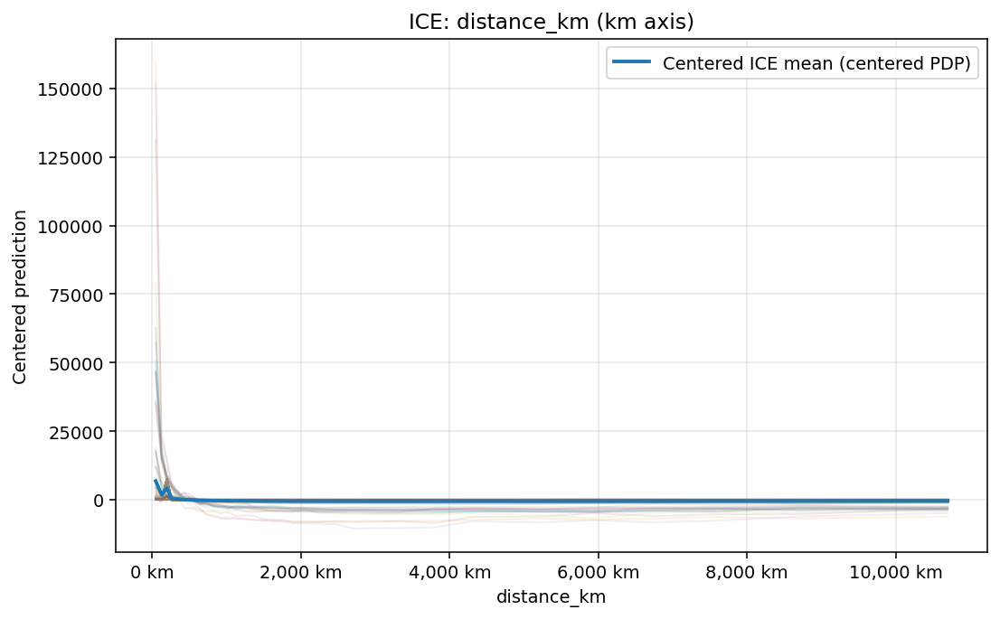

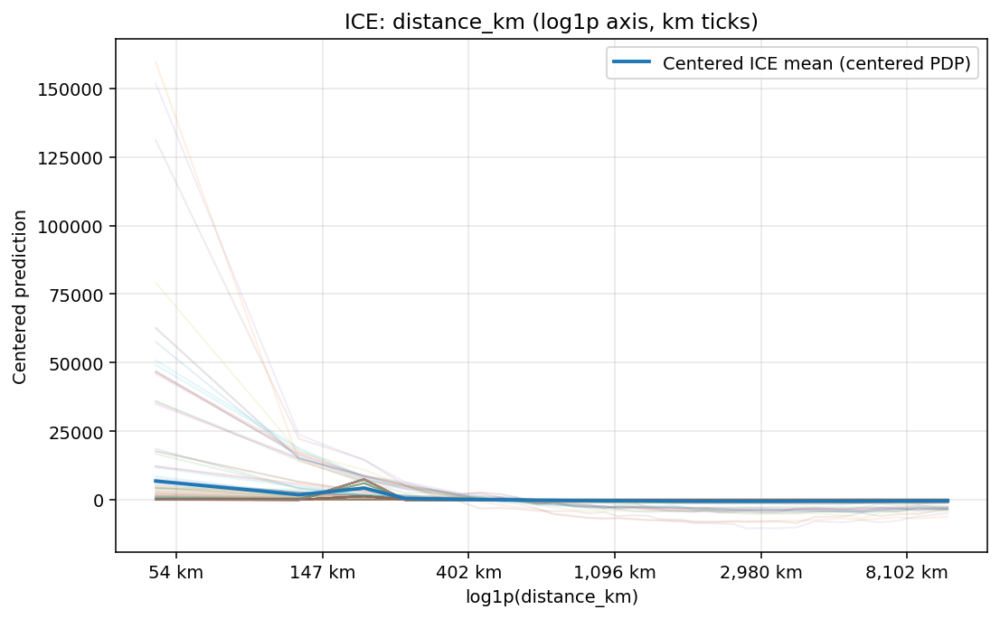

In [ ]:
'''
Use GPT-5 to visualize categorical variable distributions. Sep.27.14:12
'''

def _km_fmt(x, pos):
    try:    return f"{int(round(x)):,} km"
    except: return f"{x:.0f} km"

def _log1p_km_fmt(x, pos):
    # x is on log1p scale; show ticks as km
    km = np.expm1(x)
    try:    return f"{int(round(km)):,} km"
    except: return f"{km:.0f} km"

def quantile_grid(a, q=35, clip=(0.01,0.99)):
    a = np.asarray(a)
    lo, hi = np.quantile(a[~np.isnan(a)], clip)
    return np.quantile(a[(a>=lo)&(a<=hi)], np.linspace(0,1,q))

def ice_1d(model, X, feature,
           n_lines=200,                 # ignored if use_all_rows=True
           q=35, clip=(0.01,0.99),
           grid=None,                   # if None, build from quantiles
           center=True,                 # True -> subtract each line's mean
           use_all_rows=False,          # True -> use all rows (PDP-consistent)
           axis="km",                   # "km" or "log1p"
           title=None, show=True,
           predict_fn=_predict):        # <- uses your PDP's predict func
    """
    Returns: grid, lines (raw), mean_raw, lines_centered, mean_centered, fig, ax
    """
    # rows
    Xb = X if use_all_rows else X.sample(min(n_lines, len(X)), random_state=7)

    # grid
    if grid is None:
        grid = quantile_grid(X[feature].to_numpy(), q=q, clip=clip)

    # ICE matrix (raw predictions)
    lines = []
    for _, row in Xb.iterrows():
        Xi = pd.DataFrame([row]*len(grid))
        Xi[feature] = grid
        y = predict_fn(model, Xi)
        lines.append(y)
    lines = np.vstack(lines)                        # [n_rows, q]
    mean_raw = lines.mean(axis=0)                   # PDP on this sample/grid

    # centered versions
    lines_ctr = lines - lines.mean(axis=1, keepdims=True)
    mean_ctr  = lines_ctr.mean(axis=0)

    # choose which to plot
    to_plot = lines_ctr if center else lines
    mean_to_plot = mean_ctr if center else mean_raw

    # x transform
    if axis == "log1p":
        x_plot = np.log1p(grid)
        x_label = f"log1p({feature})"
    else:
        x_plot = grid
        x_label = feature

    # plot
    fig, ax = plt.subplots(figsize=(8,5))
    ax.plot(x_plot, to_plot.T, alpha=0.12, linewidth=1)
    ax.plot(x_plot, mean_to_plot, lw=2,
            label=("Centered ICE mean (centered PDP)"
                   if center else "ICE mean (= PDP on same sample)"))
    ax.set_xlabel(x_label); ax.set_ylabel("Centered prediction" if center else "Prediction")
    ax.set_title(title or f"ICE: {feature}")
    ax.grid(True, alpha=0.3); ax.legend(loc="best")

    # pretty ticks
    if axis == "km" and feature.endswith("distance_km"):
        ax.xaxis.set_major_formatter(FuncFormatter(_km_fmt))
    if axis == "log1p":
        ax.xaxis.set_major_formatter(FuncFormatter(_log1p_km_fmt))

    if show:
        fig.tight_layout(); plt.show()

    return grid, lines, mean_raw, lines_ctr, mean_ctr, fig, ax

# ---------- Make BOTH plots exactly as you requested ----------
# (A) km axis
_ = ice_1d(model, X_test, "distance_km",
           n_lines=200, q=35, clip=(0.01,0.99),
           center=True, use_all_rows=False,
           axis="km", title="ICE: distance_km (km axis)")

# (B) log1p axis with km-labeled ticks
_ = ice_1d(model, X_test, "distance_km",
           n_lines=200, q=35, clip=(0.01,0.99),
           center=True, use_all_rows=False,
           axis="log1p", title="ICE: distance_km (log1p axis, km ticks)")
